In [1]:
import json
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from pathlib import Path

plt.rcParams.update({'figure.dpi': 130, 'font.size': 11})
LOGS = Path('logs/rff')


## 1 · Load results

In [2]:
records = []
for p in sorted(LOGS.glob('n*/report.json')):
    r   = json.loads(p.read_text())
    cfg = r['config']
    m   = json.loads((p.parent / 'metrics.json').read_text()) if (p.parent / 'metrics.json').exists() else {}
    records.append({
        'run':            p.parent.name,
        'layers':         cfg['hidden_layers'],
        'neurons':        cfg['hidden_features'],
        'rff_features':   cfg['rff_features'],
        'rff_scale':      cfg['rff_scale'],
        'skip_at':        cfg.get('skip_at', 4),
        'batch_size':     cfg['batch_size'],
        'n_params':       r['n_params'],
        'best_psnr':      r['best_psnr'],
        'best_loss':      r['best_loss'],
        'epochs_trained': r['epochs_trained'],
        'train_sec':      r['train_sec'],
        'ssim':           m.get('ssim'),
        'lpips':          m.get('lpips'),
    })

df = pd.DataFrame(records).sort_values('run').reset_index(drop=True)
df['train_min']  = (df['train_sec'] / 60).round(1)
df['n_params_k'] = (df['n_params'] / 1e3).round(1)

display(df[['run','layers','neurons','rff_features','rff_scale','n_params_k',
            'best_psnr','ssim','lpips','epochs_trained','train_min']]
        .rename(columns={'n_params_k':'params_k','best_psnr':'PSNR (dB)',
                         'epochs_trained':'epochs','train_min':'time (min)',
                         'rff_features':'m','rff_scale':'σ'})
        .to_string(index=False))


'           run  layers  neurons   m    σ  params_k  PSNR (dB) ssim lpips  epochs  time (min)\nn4256_m256_s10       4      256 256 10.0     329.7  40.626075 None  None     332        17.6\nn6256_m256_s10       6      256 256 10.0     593.2  40.752793 None  None     236        50.1\nn8128_m256_s10       8      128 256 10.0     247.7  40.334042 None  None     426        70.5\nn8256_m128_s10       8      256 128 10.0     593.7  40.950578 None  None     463        96.7\n n8256_m256_s1       8      256 256  1.0     724.7  40.923944 None  None     388        98.6\nn8256_m256_s10       8      256 256 10.0     724.7  41.112321 None  None     393        98.9\nn8256_m256_s30       8      256 256 30.0     724.7  40.539798 None  None     490       123.3\n n8256_m256_s5       8      256 256  5.0     724.7  40.901734 None  None     141        35.4\nn8256_m256_s81       8      256 256 81.0     724.7  40.953144 None  None     650       163.4\nn8256_m512_s10       8      256 512 10.0     986.9  41.2026

## 2 · Load loss curves

In [3]:
def load_loss_curve(run_dir: Path):
    """Load final loss txt, convert MSE → PSNR, return running-maximum (best-so-far) curve."""
    txts = sorted(run_dir.glob('checkpoints/*losses_final.txt'))
    if not txts:
        return None
    losses = np.loadtxt(txts[-1])
    psnr   = -10 * np.log10(losses + 1e-8)
    return np.maximum.accumulate(psnr)

curves = {}
for p in sorted(LOGS.glob('n*/report.json')):
    name = p.parent.name
    c    = load_loss_curve(p.parent)
    if c is not None:
        curves[name] = c
        print(f'{name}: {len(c):,} steps  final PSNR {c[-1]:.2f} dB')


n4256_m256_s10: 37,403 steps  final PSNR 40.70 dB
n6256_m256_s10: 26,668 steps  final PSNR 40.83 dB
n8128_m256_s10: 48,138 steps  final PSNR 40.42 dB
n8256_m128_s10: 52,319 steps  final PSNR 41.04 dB
n8256_m256_s1: 43,844 steps  final PSNR 41.03 dB
n8256_m256_s10: 44,409 steps  final PSNR 41.17 dB
n8256_m256_s30: 55,370 steps  final PSNR 40.68 dB
n8256_m256_s5: 15,933 steps  final PSNR 41.05 dB
n8256_m256_s81: 73,450 steps  final PSNR 41.03 dB
n8256_m512_s10: 28,024 steps  final PSNR 41.27 dB
n8256_m64_s10: 40,002 steps  final PSNR 40.87 dB
n8512_m256_s10: 23,165 steps  final PSNR 41.35 dB


## 3 · Scale ablation  (layers=8 · neurons=256 · σ ∈ {1,5,10,30,81})

σ controls Gaussian frequency bandwidth: **B ~ N(0, σ²I)**.  
Effective max frequency ≈ 3σ cycles/unit (3σ rule).  
σ=81 → max ≈ 243 ≈ NeRF L=10 (2⁹=512 range).

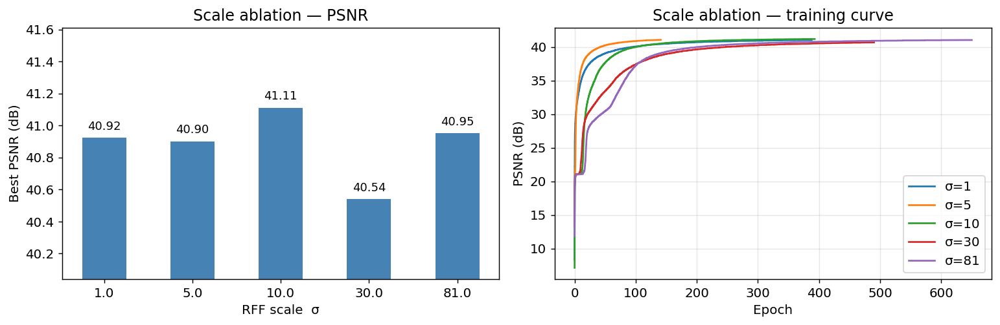

In [4]:
(LOGS / 'ablation').mkdir(exist_ok=True)

scale = df[(df.layers == 8) & (df.neurons == 256) & (df.rff_features == 256)].sort_values('rff_scale')

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

ax = axes[0]
ax.bar(scale['rff_scale'].astype(str), scale['best_psnr'], color='steelblue', width=0.5)
ax.set_xlabel('RFF scale  σ')
ax.set_ylabel('Best PSNR (dB)')
ax.set_title('Scale ablation — PSNR')
ax.set_ylim(scale['best_psnr'].min() - 0.5, scale['best_psnr'].max() + 0.5)
for bar, v in zip(ax.patches, scale['best_psnr']):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.05, f'{v:.2f}', ha='center', fontsize=10)

ax = axes[1]
for _, row in scale.iterrows():
    name = row['run']
    if name in curves:
        c = curves[name]
        steps_per_ep = len(c) // row['epochs_trained']
        epochs = np.arange(len(c)) / max(steps_per_ep, 1)
        ax.plot(epochs, c, label=f"σ={row['rff_scale']:.0f}")
ax.set_xlabel('Epoch')
ax.set_ylabel('PSNR (dB)')
ax.set_title('Scale ablation — training curve')
ax.legend()
ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(LOGS / 'ablation' / 'scale_ablation.pdf', dpi=600, bbox_inches='tight')
plt.show()


## 4 · Feature-count ablation  (layers=8 · neurons=256 · σ=10 · m ∈ {64,128,256,512})

m controls encoding dimensionality: output = 2m (+3 with passthrough).

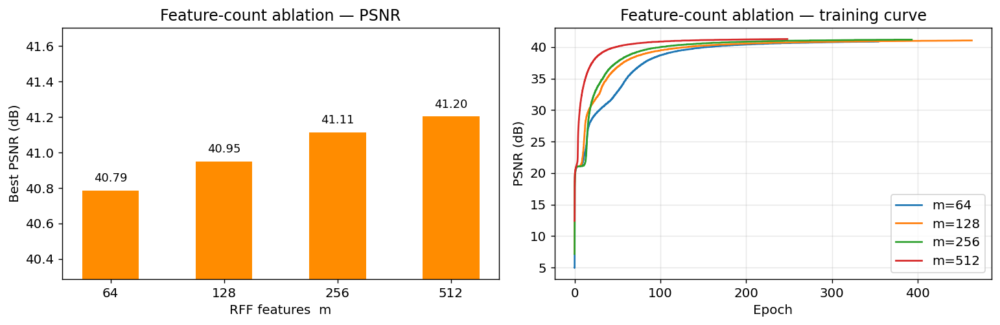

In [5]:
feat = df[(df.layers == 8) & (df.neurons == 256) & (df.rff_scale == 10)].sort_values('rff_features')

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

ax = axes[0]
ax.bar(feat['rff_features'].astype(str), feat['best_psnr'], color='darkorange', width=0.5)
ax.set_xlabel('RFF features  m')
ax.set_ylabel('Best PSNR (dB)')
ax.set_title('Feature-count ablation — PSNR')
ax.set_ylim(feat['best_psnr'].min() - 0.5, feat['best_psnr'].max() + 0.5)
for bar, v in zip(ax.patches, feat['best_psnr']):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.05, f'{v:.2f}', ha='center', fontsize=10)

ax = axes[1]
for _, row in feat.iterrows():
    name = row['run']
    if name in curves:
        c = curves[name]
        steps_per_ep = len(c) // row['epochs_trained']
        epochs = np.arange(len(c)) / max(steps_per_ep, 1)
        ax.plot(epochs, c, label=f"m={int(row['rff_features'])}")
ax.set_xlabel('Epoch')
ax.set_ylabel('PSNR (dB)')
ax.set_title('Feature-count ablation — training curve')
ax.legend()
ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(LOGS / 'ablation' / 'feat_ablation.pdf', dpi=600, bbox_inches='tight')
plt.show()


## 5 · Depth ablation  (layers ∈ {4,6,8} · neurons=256 · σ=10 · m=256)

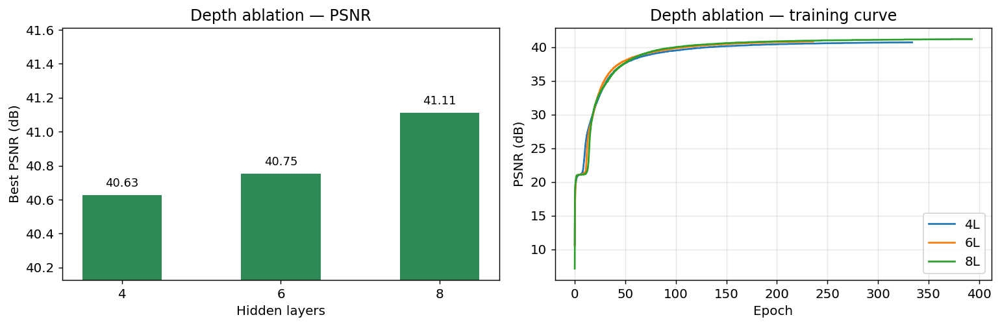

In [6]:
depth = df[(df.neurons == 256) & (df.rff_scale == 10) & (df.rff_features == 256)].sort_values('layers')

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

ax = axes[0]
ax.bar(depth['layers'].astype(str), depth['best_psnr'], color='seagreen', width=0.5)
ax.set_xlabel('Hidden layers')
ax.set_ylabel('Best PSNR (dB)')
ax.set_title('Depth ablation — PSNR')
ax.set_ylim(depth['best_psnr'].min() - 0.5, depth['best_psnr'].max() + 0.5)
for bar, v in zip(ax.patches, depth['best_psnr']):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.05, f'{v:.2f}', ha='center', fontsize=10)

ax = axes[1]
for _, row in depth.iterrows():
    name = row['run']
    if name in curves:
        c = curves[name]
        steps_per_ep = len(c) // row['epochs_trained']
        epochs = np.arange(len(c)) / max(steps_per_ep, 1)
        ax.plot(epochs, c, label=f"{int(row['layers'])}L")
ax.set_xlabel('Epoch')
ax.set_ylabel('PSNR (dB)')
ax.set_title('Depth ablation — training curve')
ax.legend()
ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(LOGS / 'ablation' / 'depth_ablation.pdf', dpi=600, bbox_inches='tight')
plt.show()


## 6 · Width ablation  (layers=8 · neurons ∈ {128,256,512} · σ=10 · m=256)

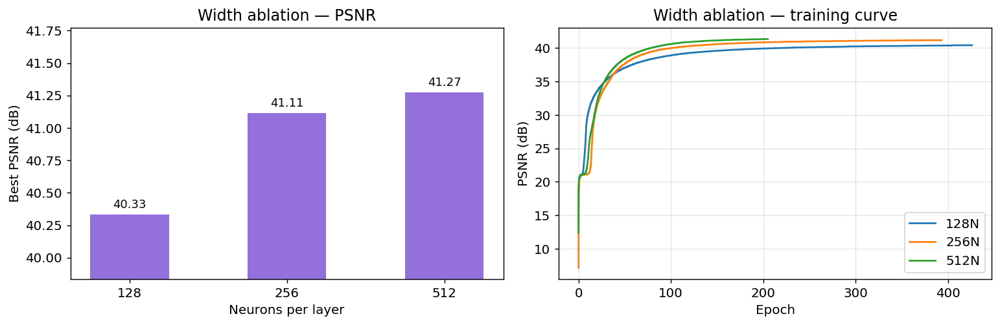

In [7]:
width = df[(df.layers == 8) & (df.rff_scale == 10) & (df.rff_features == 256)].sort_values('neurons')

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

ax = axes[0]
ax.bar(width['neurons'].astype(str), width['best_psnr'], color='mediumpurple', width=0.5)
ax.set_xlabel('Neurons per layer')
ax.set_ylabel('Best PSNR (dB)')
ax.set_title('Width ablation — PSNR')
ax.set_ylim(width['best_psnr'].min() - 0.5, width['best_psnr'].max() + 0.5)
for bar, v in zip(ax.patches, width['best_psnr']):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.05, f'{v:.2f}', ha='center', fontsize=10)

ax = axes[1]
for _, row in width.iterrows():
    name = row['run']
    if name in curves:
        c = curves[name]
        steps_per_ep = len(c) // row['epochs_trained']
        epochs = np.arange(len(c)) / max(steps_per_ep, 1)
        ax.plot(epochs, c, label=f"{int(row['neurons'])}N")
ax.set_xlabel('Epoch')
ax.set_ylabel('PSNR (dB)')
ax.set_title('Width ablation — training curve')
ax.legend()
ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(LOGS / 'ablation' / 'width_ablation.pdf', dpi=600, bbox_inches='tight')
plt.show()


## 7 · Efficiency — PSNR vs parameters & training time

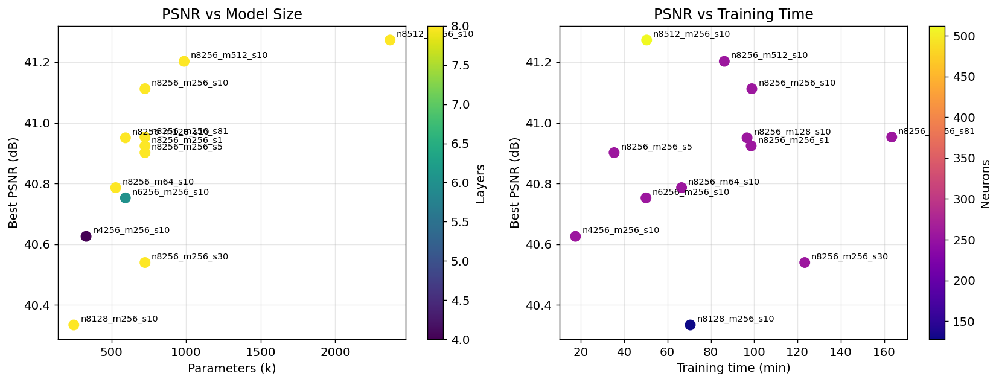

In [8]:
fig, axes = plt.subplots(1, 2, figsize=(13, 5))

ax = axes[0]
sc = ax.scatter(df['n_params_k'], df['best_psnr'], s=80, c=df['layers'], cmap='viridis', zorder=3)
plt.colorbar(sc, ax=ax, label='Layers')
for _, row in df.iterrows():
    ax.annotate(row['run'], (row['n_params_k'], row['best_psnr']),
                textcoords='offset points', xytext=(6, 3), fontsize=8)
ax.set_xlabel('Parameters (k)')
ax.set_ylabel('Best PSNR (dB)')
ax.set_title('PSNR vs Model Size')
ax.grid(alpha=0.3)

ax = axes[1]
sc = ax.scatter(df['train_min'], df['best_psnr'], s=80, c=df['neurons'], cmap='plasma', zorder=3)
plt.colorbar(sc, ax=ax, label='Neurons')
for _, row in df.iterrows():
    ax.annotate(row['run'], (row['train_min'], row['best_psnr']),
                textcoords='offset points', xytext=(6, 3), fontsize=8)
ax.set_xlabel('Training time (min)')
ax.set_ylabel('Best PSNR (dB)')
ax.set_title('PSNR vs Training Time')
ax.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(LOGS / 'ablation' / 'efficiency.pdf', dpi=600, bbox_inches='tight')
plt.show()


## 8 · All training curves

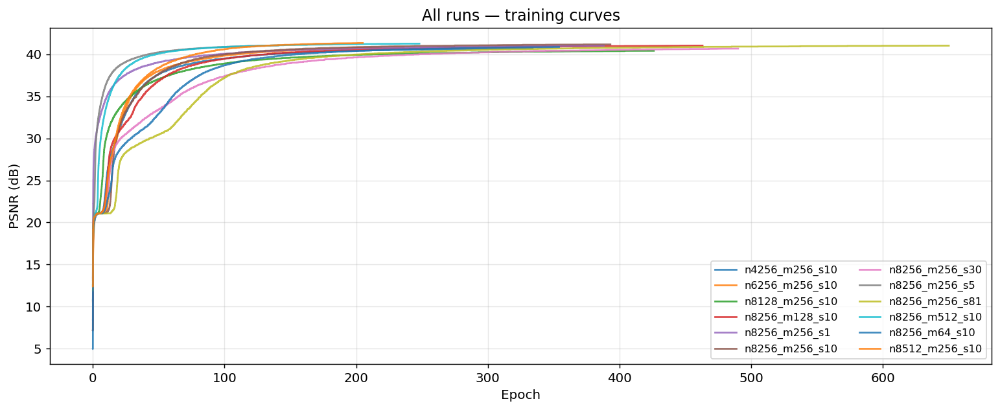

In [9]:
fig, ax = plt.subplots(figsize=(12, 5))
for name, c in sorted(curves.items()):
    row = df[df.run == name]
    if row.empty:
        continue
    ep = row['epochs_trained'].values[0]
    steps_per_ep = len(c) // ep
    epochs = np.arange(len(c)) / max(steps_per_ep, 1)
    ax.plot(epochs, c, label=name, alpha=0.85)

ax.set_xlabel('Epoch')
ax.set_ylabel('PSNR (dB)')
ax.set_title('All runs — training curves')
ax.legend(fontsize=9, ncol=2)
ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig(LOGS / 'ablation' / 'all_curves.pdf', dpi=600, bbox_inches='tight')
plt.show()


## 8b · Summary table + export CSV

In [10]:
has_metrics = df['ssim'].notna().any()
cols    = ['run','layers','neurons','rff_features','rff_scale','n_params','best_psnr','best_loss','epochs_trained','batch_size']
renames = {'best_psnr':'PSNR (dB)', 'best_loss':'MSE', 'epochs_trained':'epochs',
           'rff_features':'m', 'rff_scale':'σ'}
if has_metrics:
    cols = cols[:7] + ['ssim','lpips'] + cols[7:]
    renames.update({'ssim':'SSIM ↑', 'lpips':'LPIPS ↓'})

summary = df[cols].copy()
summary['best_psnr'] = summary['best_psnr'].round(2)
summary['best_loss'] = summary['best_loss'].map('{:.2e}'.format)
if has_metrics:
    summary['ssim']  = summary['ssim'].map(lambda v: f'{v:.4f}' if v is not None else 'N/A')
    summary['lpips'] = summary['lpips'].map(lambda v: f'{v:.4f}' if v is not None else 'N/A')
summary = summary.rename(columns=renames)
summary.to_csv(LOGS / 'ablation' / 'results.csv', index=False)
print('Saved → logs/rff/ablation/results.csv')
display(summary)


Saved → logs/rff/ablation/results.csv


,run,layers,neurons,m,σ,n_params,PSNR (dB),MSE,epochs,batch_size
0,n4256_m256_s10,4,256,256,10.0,329729,40.63,8.66e-05,332,1048576
1,n6256_m256_s10,6,256,256,10.0,593153,40.75,8.41e-05,236,1048576
2,n8128_m256_s10,8,128,256,10.0,247681,40.33,9.26e-05,426,1048576
3,n8256_m128_s10,8,256,128,10.0,593665,40.95,8.03e-05,463,1048576
4,n8256_m256_s1,8,256,256,1.0,724737,40.92,8.08e-05,388,1048576
5,n8256_m256_s10,8,256,256,10.0,724737,41.11,7.74e-05,393,1048576
6,n8256_m256_s30,8,256,256,30.0,724737,40.54,8.83e-05,490,1048576
7,n8256_m256_s5,8,256,256,5.0,724737,40.90,8.12e-05,141,1048576
8,n8256_m256_s81,8,256,256,81.0,724737,40.95,8.03e-05,650,1048576
9,n8256_m512_s10,8,256,512,10.0,986881,41.20,7.58e-05,248,1048576


## 9 · Setup — model loader, volume, helpers

In [11]:
import sys, torch, torch.nn.functional as F
sys.path.insert(0, str(Path('.')))
from src.rff import RFFModel
from skimage.metrics import structural_similarity
import lpips as lpips_lib
import tifffile

INPUT       = '10-2900-control-cell-05.oif-C0.v3dpbd.tif'
INFER_BATCH = 2**20
SLICE_IDXS  = [20, 40, 60, 80]
LPIPS_SZ    = 256

vol_raw = tifffile.imread(INPUT).astype('float32')
vmin_v, vmax_v = vol_raw.min(), vol_raw.max()
gt_vol  = (vol_raw - vmin_v) / (vmax_v - vmin_v)
D, H, W = gt_vol.shape
slice_idxs = [max(0, min(D-1, z)) for z in SLICE_IDXS]

axes_g   = [np.linspace(-1, 1, s, dtype='float32') for s in (D, H, W)]
coords_t = torch.from_numpy(
    np.stack([g.flatten() for g in np.meshgrid(*axes_g, indexing='ij')], axis=-1))

lpips_fn = lpips_lib.LPIPS(net='alex').cuda()
lpips_fn.eval()

def reconstruct(model):
    model.cuda().eval()
    parts = []
    with torch.no_grad():
        for i in range(0, len(coords_t), INFER_BATCH):
            parts.append(model(coords_t[i:i+INFER_BATCH].cuda()).squeeze(-1).cpu())
    return torch.cat(parts).numpy().reshape(D, H, W)

def find_best_ckpt(run_dir):
    bests = sorted(run_dir.glob('checkpoints/*_best.pth'))
    return bests[-1] if bests else None

def load_rff_model(row):
    run_dir = LOGS / row['run']
    ckpt    = find_best_ckpt(run_dir)
    if ckpt is None:
        return None
    model = RFFModel(
        in_features=3,
        hidden_features=int(row['neurons']),
        hidden_layers=int(row['layers']),
        out_features=1,
        rff_features=int(row['rff_features']),
        rff_scale=float(row['rff_scale']),
        skip_at=int(row['skip_at']),
    )
    sd = torch.load(ckpt, weights_only=True)
    sd = {k.replace('_orig_mod.', ''): v for k, v in sd.items()}
    model.load_state_dict(sd)
    return model

def slice_metrics(gt_sl, rc_sl):
    ssim_val = structural_similarity(gt_sl, rc_sl, data_range=1.0)
    gt_t = torch.from_numpy(gt_sl)[None, None].expand(1, 3, -1, -1)
    rc_t = torch.from_numpy(rc_sl)[None, None].expand(1, 3, -1, -1)
    gt_t = F.interpolate(gt_t, LPIPS_SZ, mode='bilinear', align_corners=False)
    rc_t = F.interpolate(rc_t, LPIPS_SZ, mode='bilinear', align_corners=False)
    with torch.no_grad():
        lp_val = lpips_fn(gt_t.cuda()*2-1, rc_t.cuda()*2-1).item()
    return ssim_val, lp_val

print(f'Volume {D}×{H}×{W}   slices at z={slice_idxs}')


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/home/armin/miniconda3/envs/mink/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/armin/miniconda3/envs/mink/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /home/armin/miniconda3/envs/mink/lib/python3.8/site-packages/lpips/weights/v0.1/alex.pth
Volume 113×1024×1024   slices at z=[20, 40, 60, 80]


/home/armin/miniconda3/envs/mink/lib/python3.8/site-packages/lpips/lpips.py:107: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(model_path, ma

## 10 · SSIM & LPIPS

In [12]:
N_LPIPS_SLICES = 20

metrics_rows = []
for _, row in df.iterrows():
    run_dir      = LOGS / row['run']
    metrics_path = run_dir / 'metrics.json'

    if metrics_path.exists():
        m = json.loads(metrics_path.read_text())
        print(f"{row['run']}: cached   SSIM={m['ssim']:.4f}  LPIPS={m['lpips']:.4f}")
        metrics_rows.append({'run': row['run'], **m})
        continue

    model = load_rff_model(row)
    if model is None:
        print(f"{row['run']}: no checkpoint — skipping")
        continue

    recon = reconstruct(model)
    torch.cuda.empty_cache()

    ssim_val = float(np.mean([
        structural_similarity(gt_vol[z], recon[z], data_range=1.0)
        for z in range(D)
    ]))

    z_idxs  = np.linspace(0, D - 1, N_LPIPS_SLICES, dtype=int)
    lp_vals = []
    for z in z_idxs:
        gt_t = torch.from_numpy(gt_vol[z])[None, None].expand(1, 3, -1, -1)
        rc_t = torch.from_numpy(recon[z])[None, None].expand(1, 3, -1, -1)
        gt_t = F.interpolate(gt_t, LPIPS_SZ, mode='bilinear', align_corners=False)
        rc_t = F.interpolate(rc_t, LPIPS_SZ, mode='bilinear', align_corners=False)
        with torch.no_grad():
            lp_vals.append(lpips_fn(gt_t.cuda() * 2 - 1, rc_t.cuda() * 2 - 1).item())
    lpips_val = float(np.mean(lp_vals))

    m = {'ssim': ssim_val, 'lpips': lpips_val}
    metrics_path.write_text(json.dumps(m, indent=2))
    print(f"{row['run']}: computed  SSIM={ssim_val:.4f}  LPIPS={lpips_val:.4f}  → saved")
    metrics_rows.append({'run': row['run'], **m})
    del recon

mdf = pd.DataFrame(metrics_rows)
for col in ('ssim', 'lpips'):
    df[col] = df['run'].map(mdf.set_index('run')[col])


n4256_m256_s10: computed  SSIM=0.9295  LPIPS=0.0360  → saved
n6256_m256_s10: computed  SSIM=0.9297  LPIPS=0.0346  → saved
n8128_m256_s10: computed  SSIM=0.9283  LPIPS=0.0419  → saved
n8256_m128_s10: computed  SSIM=0.9307  LPIPS=0.0311  → saved
n8256_m256_s1: computed  SSIM=0.9315  LPIPS=0.0394  → saved
n8256_m256_s10: computed  SSIM=0.9314  LPIPS=0.0311  → saved
n8256_m256_s30: computed  SSIM=0.9287  LPIPS=0.0319  → saved
n8256_m256_s5: computed  SSIM=0.9309  LPIPS=0.0353  → saved
n8256_m256_s81: computed  SSIM=0.9307  LPIPS=0.0322  → saved
n8256_m512_s10: computed  SSIM=0.9320  LPIPS=0.0287  → saved
n8256_m64_s10: computed  SSIM=0.9299  LPIPS=0.0345  → saved
n8512_m256_s10: computed  SSIM=0.9323  LPIPS=0.0273  → saved


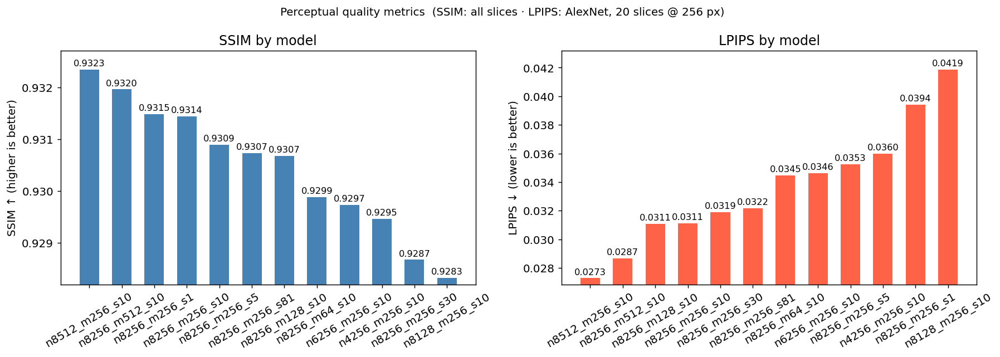

Saved → logs/rff/ablation/ssim_lpips.pdf


In [13]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for ax, col, label, color, ascending in [
    (axes[0], 'ssim',  'SSIM ↑ (higher is better)',  'steelblue', False),
    (axes[1], 'lpips', 'LPIPS ↓ (lower is better)', 'tomato',    True),
]:
    vals = df[col].dropna()
    if vals.empty:
        ax.set_title(f'{col.upper()} — no data'); continue
    ordered = df.sort_values(col, ascending=ascending).reset_index(drop=True)
    bars = ax.bar(ordered['run'], ordered[col], color=color, width=0.6)
    ax.set_ylabel(label)
    ax.set_title(f'{col.upper()} by model')
    ax.tick_params(axis='x', rotation=30)
    pad = (ordered[col].max() - ordered[col].min()) * 0.03 + 1e-6
    ax.set_ylim(ordered[col].min() - pad, ordered[col].max() + pad * 3)
    for bar, v in zip(bars, ordered[col]):
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + pad * 0.3,
                f'{v:.4f}', ha='center', va='bottom', fontsize=9)

plt.suptitle('Perceptual quality metrics  (SSIM: all slices · LPIPS: AlexNet, 20 slices @ 256 px)',
             fontsize=11)
plt.tight_layout()
plt.savefig(LOGS / 'ablation' / 'ssim_lpips.pdf', dpi=600, bbox_inches='tight')
plt.show()
print('Saved → logs/rff/ablation/ssim_lpips.pdf')


## 9 · Volume reconstruction — GT / Recon / Diff  (slices 20 · 40 · 60 · 80)

Processing run n4256_m256_s10...


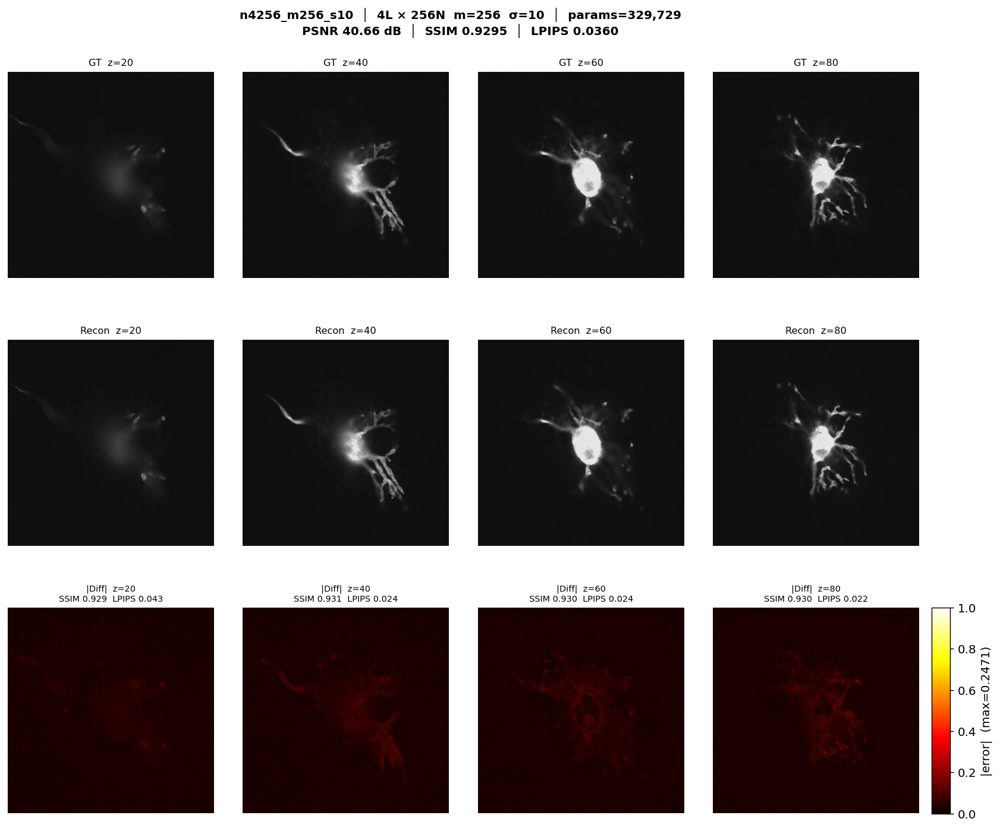

Saved → logs/rff/ablation/recon_n4256_m256_s10.pdf
Processing run n6256_m256_s10...


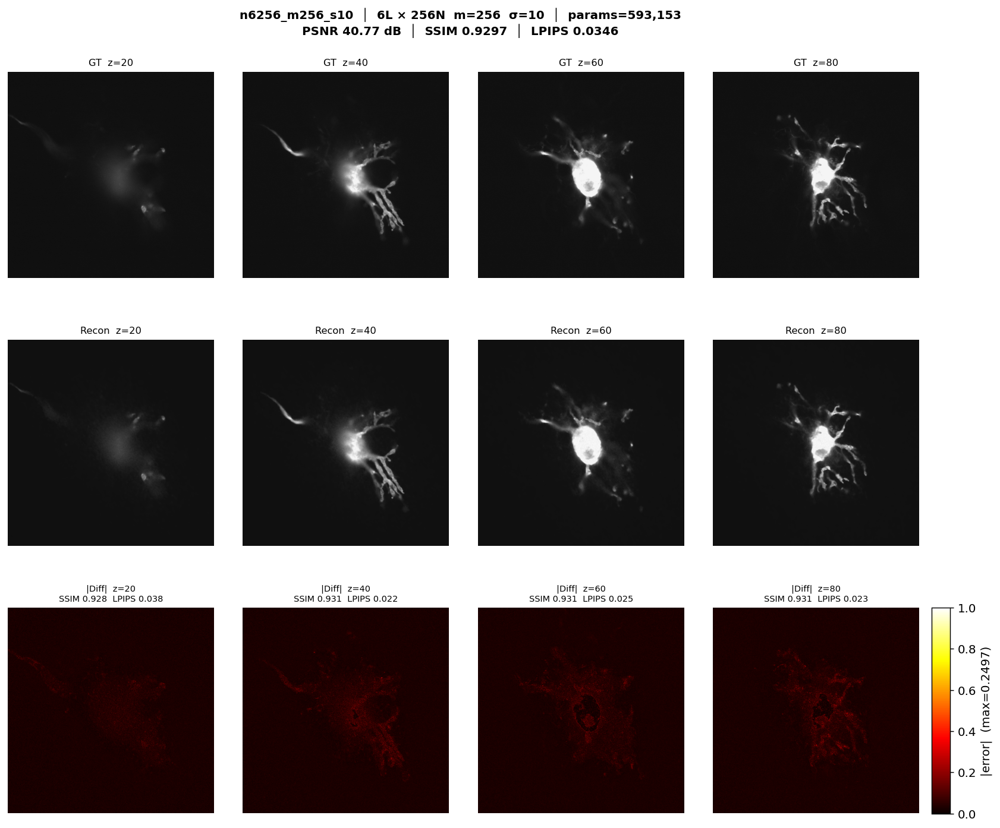

Saved → logs/rff/ablation/recon_n6256_m256_s10.pdf
Processing run n8128_m256_s10...


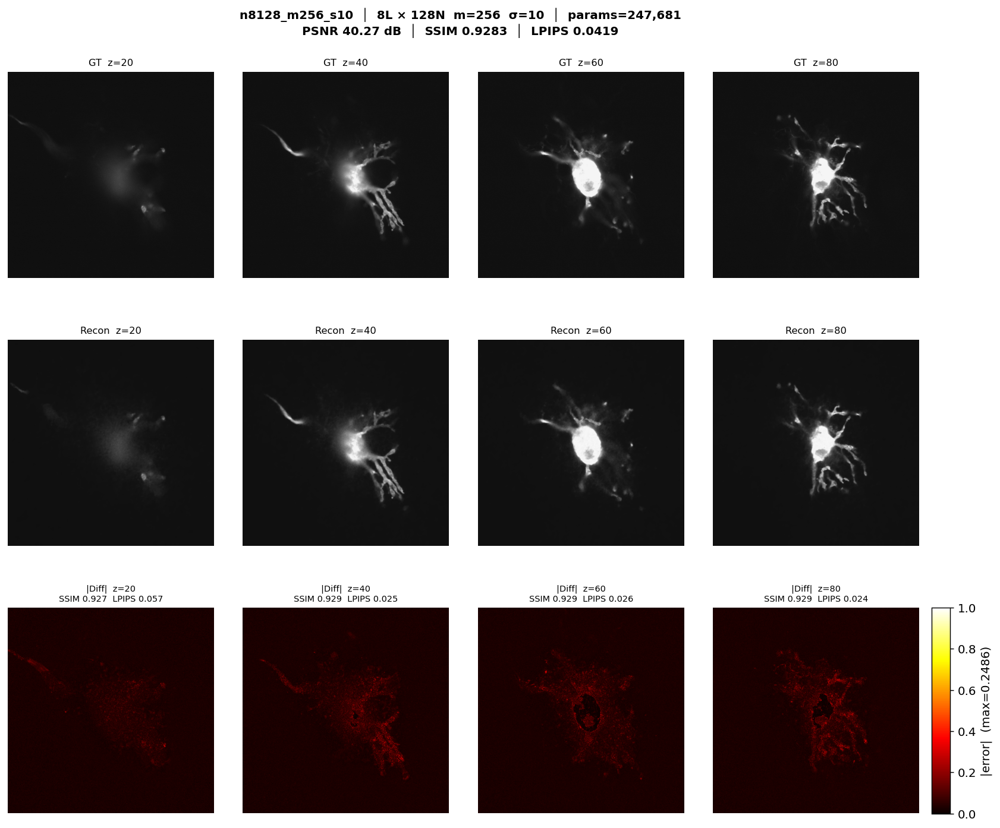

Saved → logs/rff/ablation/recon_n8128_m256_s10.pdf
Processing run n8256_m128_s10...


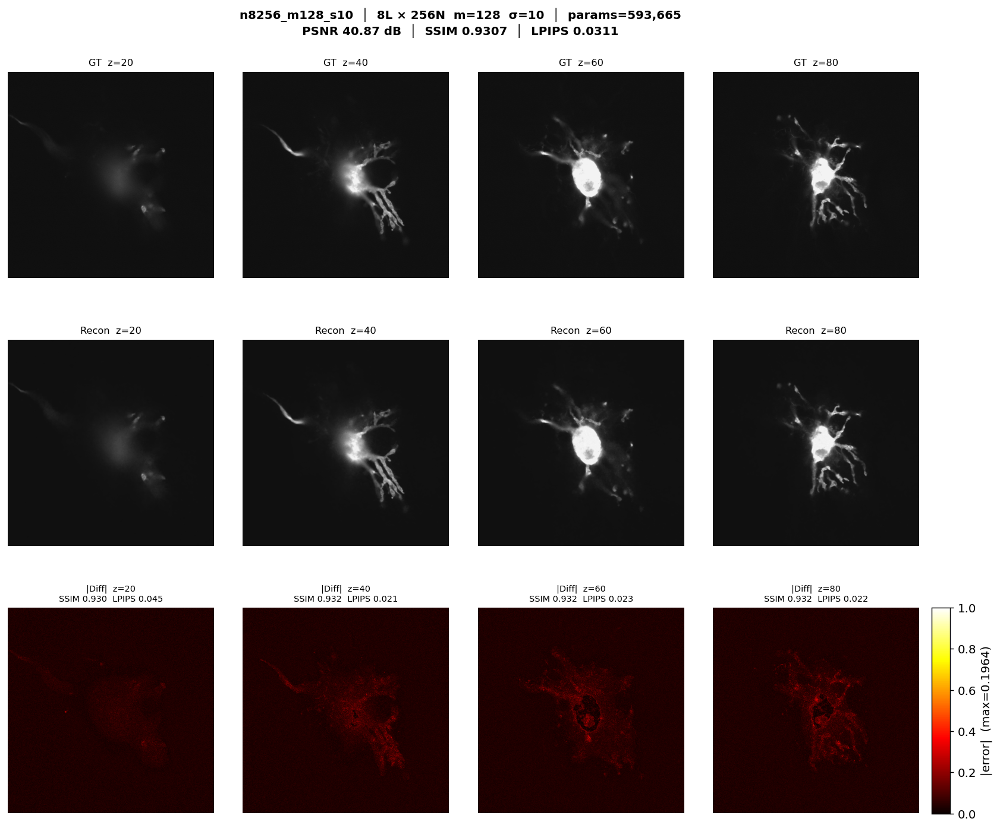

Saved → logs/rff/ablation/recon_n8256_m128_s10.pdf
Processing run n8256_m256_s1...


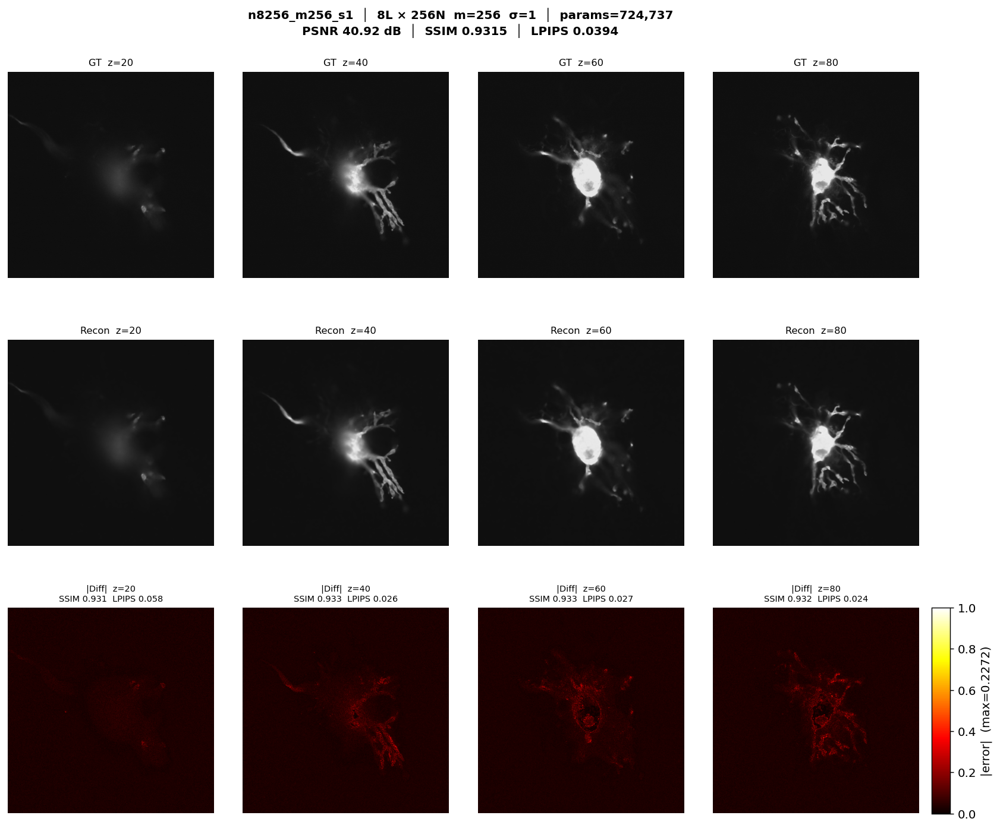

Saved → logs/rff/ablation/recon_n8256_m256_s1.pdf
Processing run n8256_m256_s10...


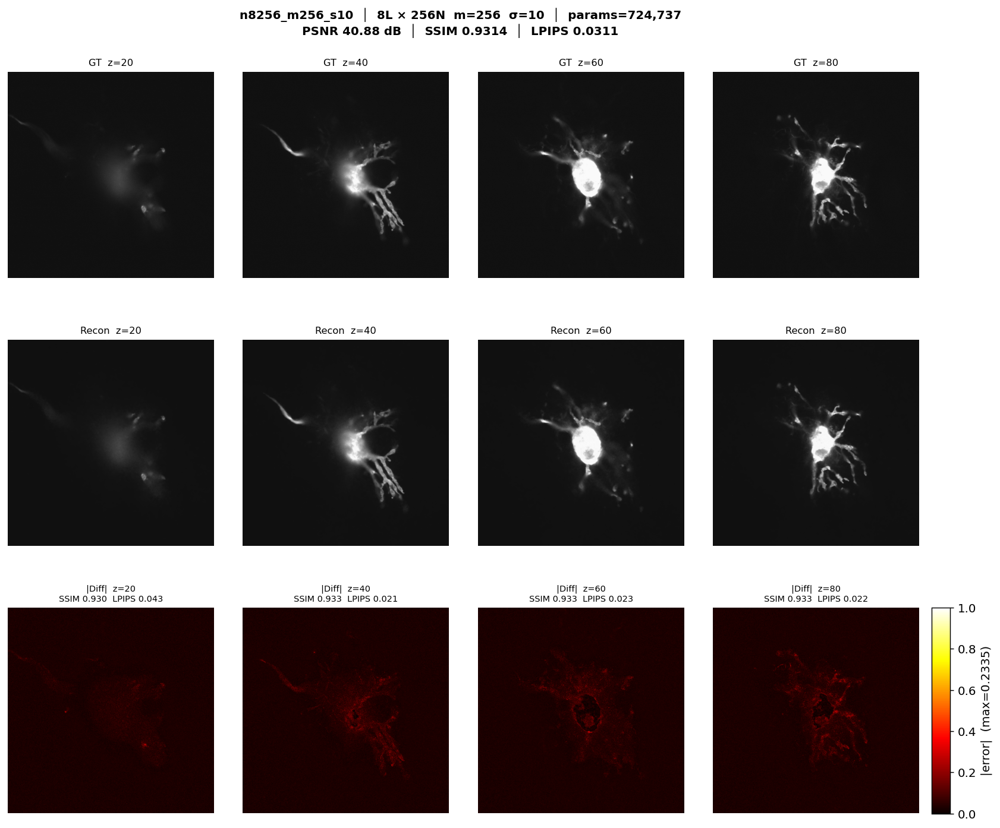

Saved → logs/rff/ablation/recon_n8256_m256_s10.pdf
Processing run n8256_m256_s30...


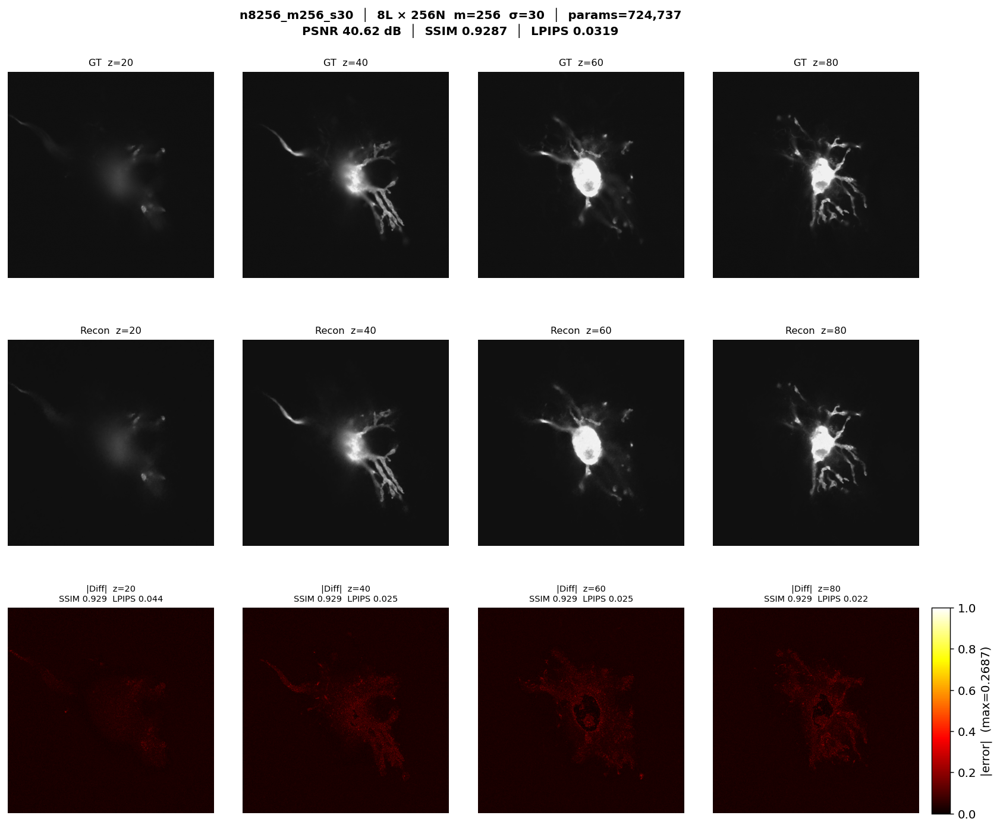

Saved → logs/rff/ablation/recon_n8256_m256_s30.pdf
Processing run n8256_m256_s5...


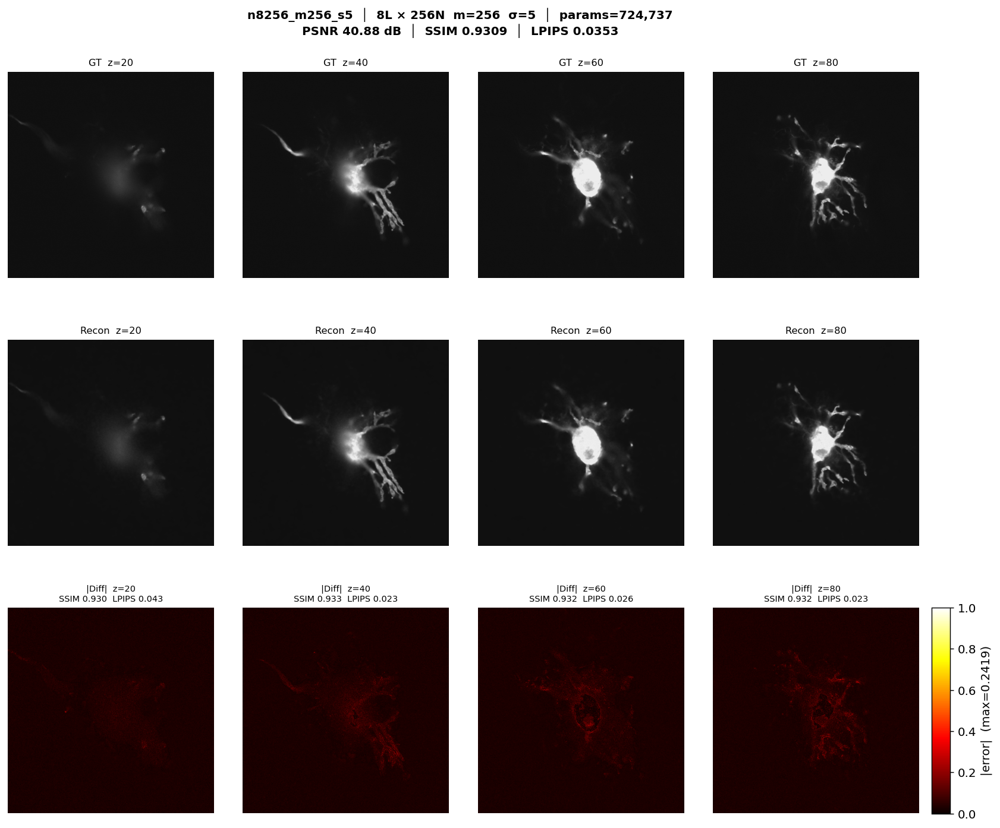

Saved → logs/rff/ablation/recon_n8256_m256_s5.pdf
Processing run n8256_m256_s81...


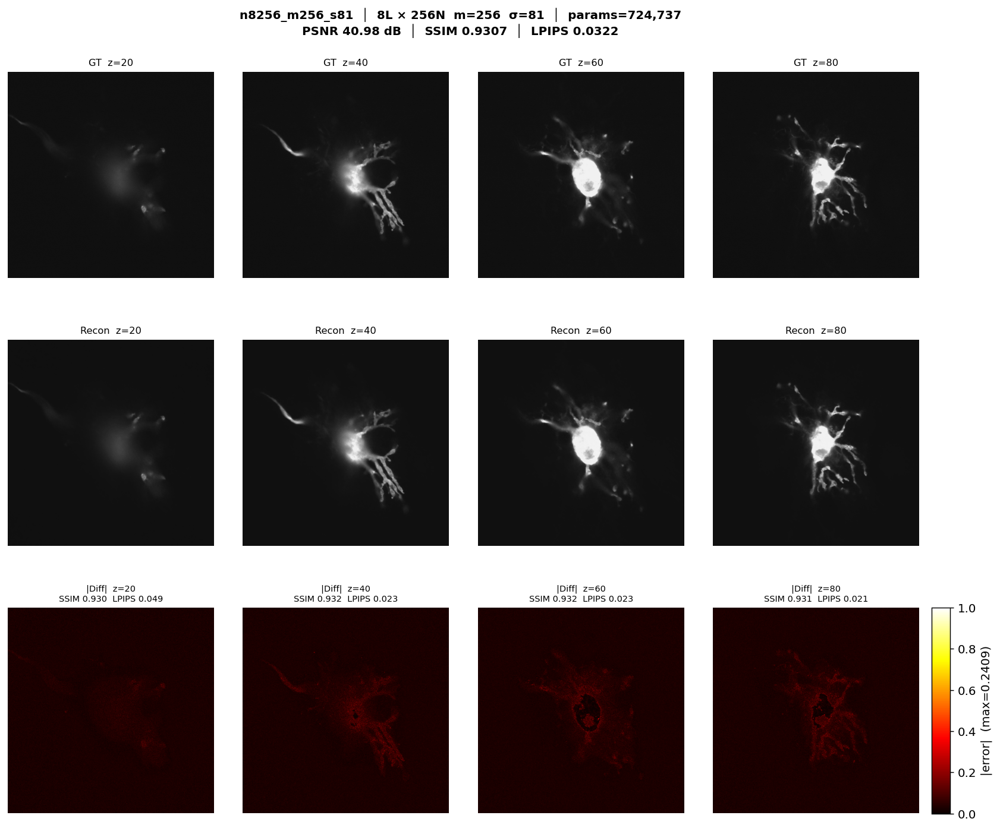

Saved → logs/rff/ablation/recon_n8256_m256_s81.pdf
Processing run n8256_m512_s10...


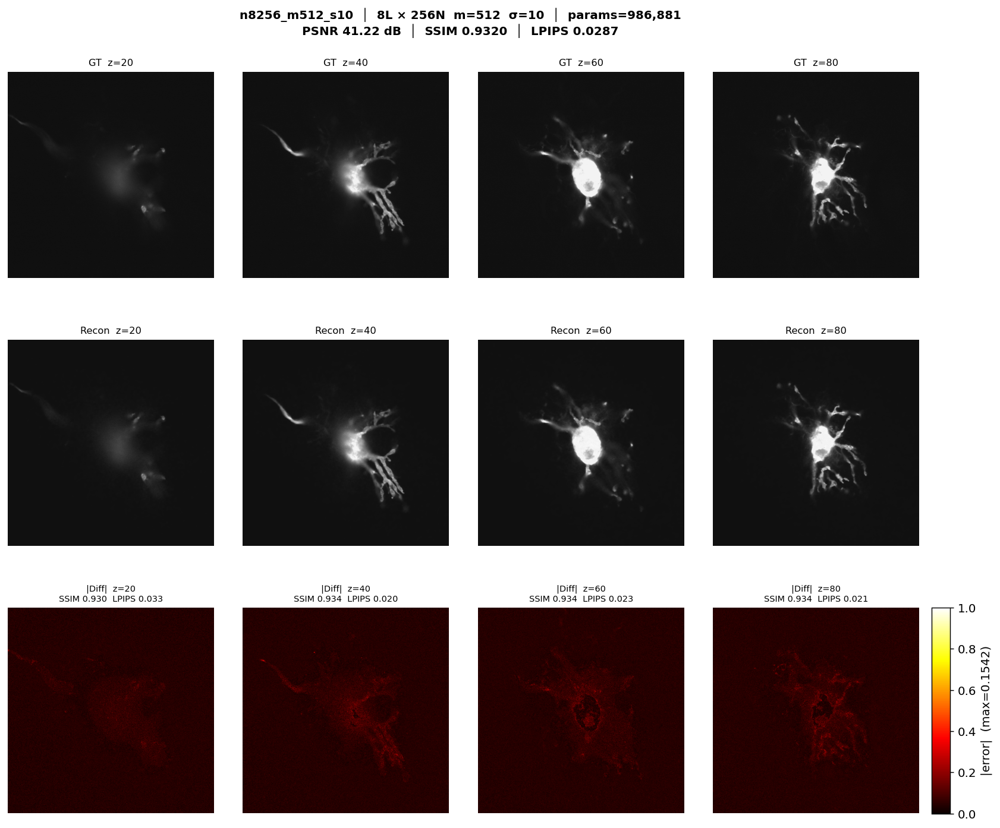

Saved → logs/rff/ablation/recon_n8256_m512_s10.pdf
Processing run n8256_m64_s10...


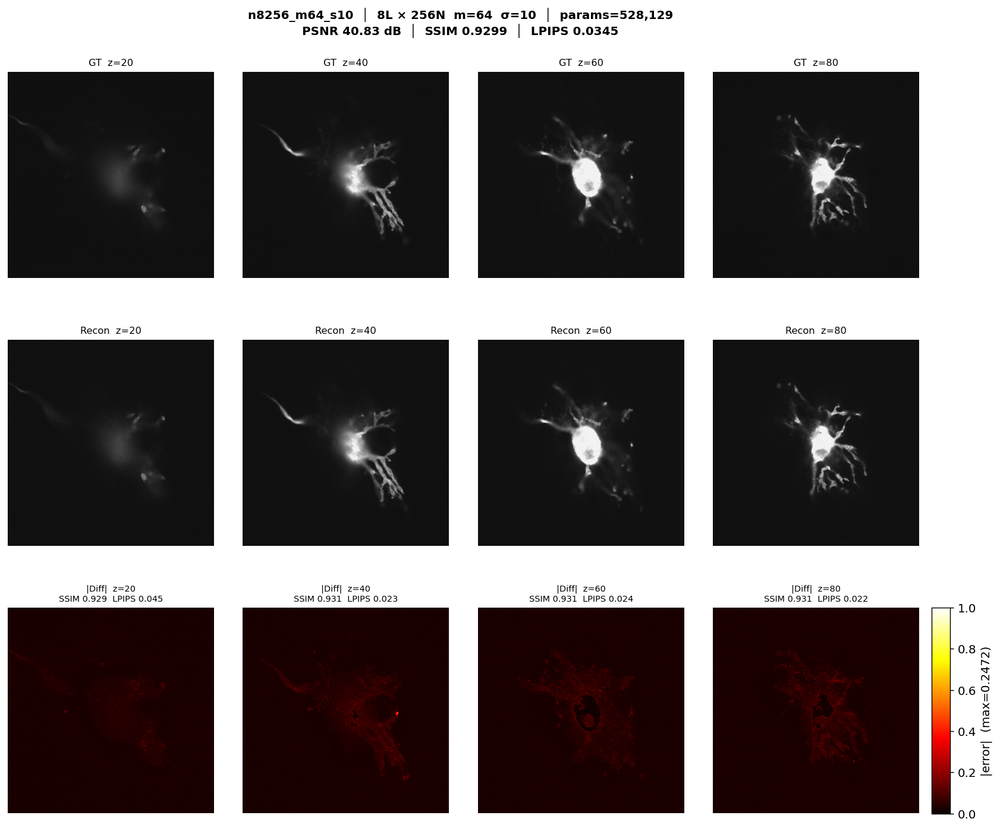

Saved → logs/rff/ablation/recon_n8256_m64_s10.pdf
Processing run n8512_m256_s10...


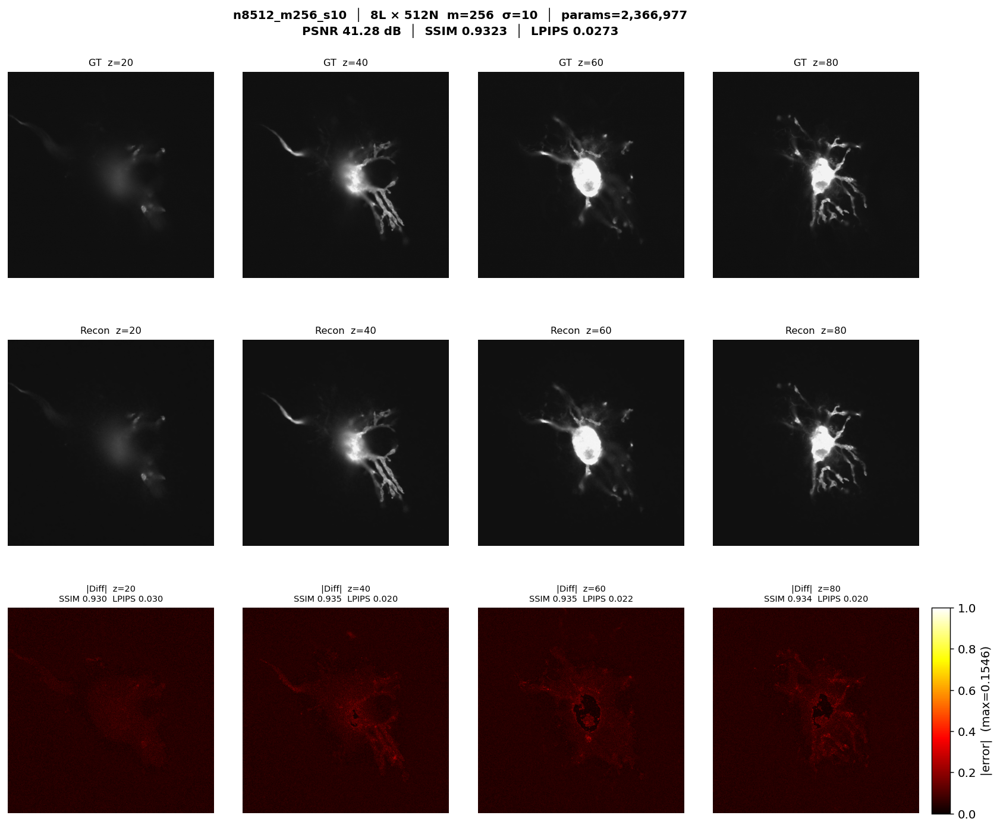

Saved → logs/rff/ablation/recon_n8512_m256_s10.pdf


In [14]:
for _, row in df.iterrows():
    print(f"Processing run {row['run']}...")
    model = load_rff_model(row)
    if model is None:
        print(f"{row['run']}: no checkpoint, skipping")
        continue

    recon = reconstruct(model)
    diff  = np.abs(recon - gt_vol)
    psnr_full = float(-10 * np.log10(((recon - gt_vol)**2).mean() + 1e-8))

    fig, axes = plt.subplots(3, 4, figsize=(16, 12))
    fig.subplots_adjust(top=0.91, right=0.88, hspace=0.30, wspace=0.03)
    ssim_s  = f"{float(row['ssim']):.4f}"  if row['ssim']  is not None else 'N/A'
    lpips_s = f"{float(row['lpips']):.4f}" if row['lpips'] is not None else 'N/A'
    fig.suptitle(
        f"{row['run']}  │  {int(row['layers'])}L × {int(row['neurons'])}N  "
        f"m={int(row['rff_features'])}  σ={row['rff_scale']:.0f}  │  params={int(row['n_params']):,}\n"
        f"PSNR {psnr_full:.2f} dB  │  SSIM {ssim_s}  │  LPIPS {lpips_s}",
        fontsize=11, fontweight='bold'
    )

    gr_min   = min(gt_vol.min(), recon.min())
    gr_max   = max(gt_vol.max(), recon.max())
    diff_max = diff.max() + 1e-8

    for col, z in enumerate(slice_idxs):
        axes[0, col].imshow(gt_vol[z], cmap='gray', vmin=gr_min, vmax=gr_max)
        axes[0, col].set_title(f'GT  z={z}', fontsize=9)

        axes[1, col].imshow(recon[z], cmap='gray', vmin=gr_min, vmax=gr_max)
        axes[1, col].set_title(f'Recon  z={z}', fontsize=9)

        im = axes[2, col].imshow(diff[z] / diff_max, cmap='hot', vmin=0, vmax=1)
        s, lp = slice_metrics(gt_vol[z], recon[z])
        axes[2, col].set_title(f'|Diff|  z={z}\nSSIM {s:.3f}  LPIPS {lp:.3f}', fontsize=8)

    for ax in axes.flat:
        ax.axis('off')

    fig.canvas.draw()
    p0 = axes[2, 0].get_position()
    p1 = axes[2, -1].get_position()
    cbar_ax = fig.add_axes([p1.x1 + 0.01, p0.y0, 0.015, p0.y1 - p0.y0])
    fig.colorbar(im, cax=cbar_ax, label=f'|error|  (max={diff_max:.4f})')

    out = LOGS / 'ablation' / f"recon_{row['run']}.pdf"
    plt.savefig(out, dpi=600, bbox_inches='tight')
    plt.show()
    print(f'Saved → {out}')
    torch.cuda.empty_cache()


## 9b · Maximum Intensity Projection (MIP) — XY · XZ · ZY

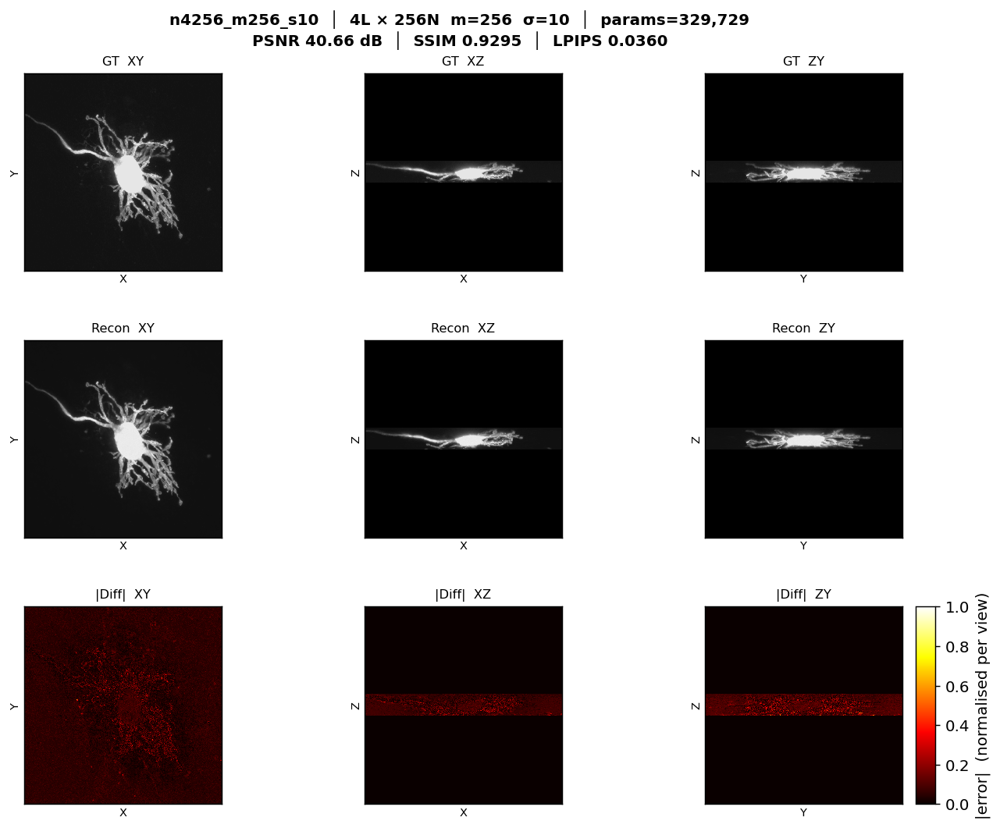

Saved → logs/rff/ablation/mip_n4256_m256_s10.pdf


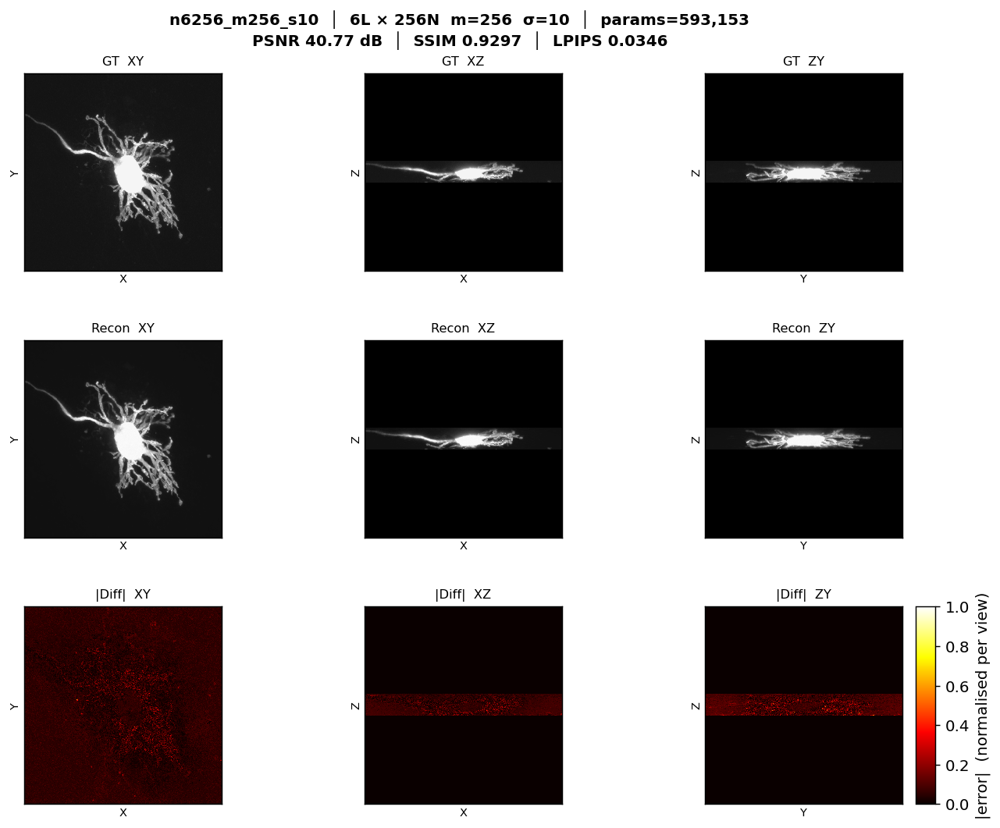

Saved → logs/rff/ablation/mip_n6256_m256_s10.pdf


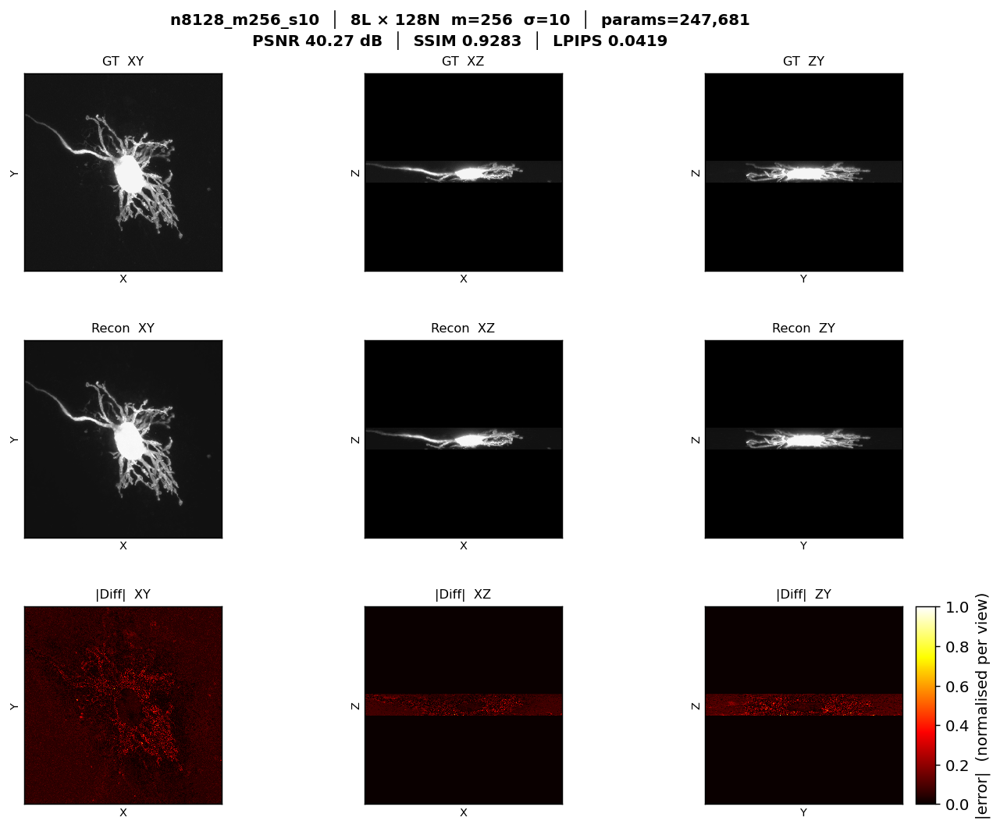

Saved → logs/rff/ablation/mip_n8128_m256_s10.pdf


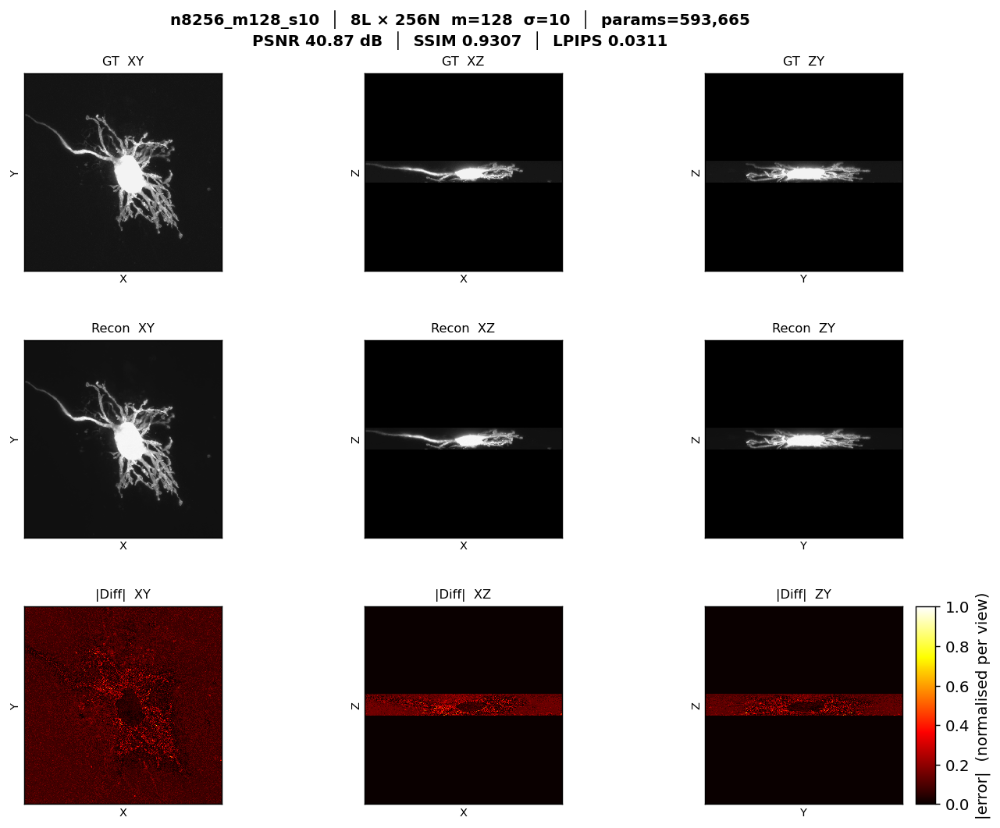

Saved → logs/rff/ablation/mip_n8256_m128_s10.pdf


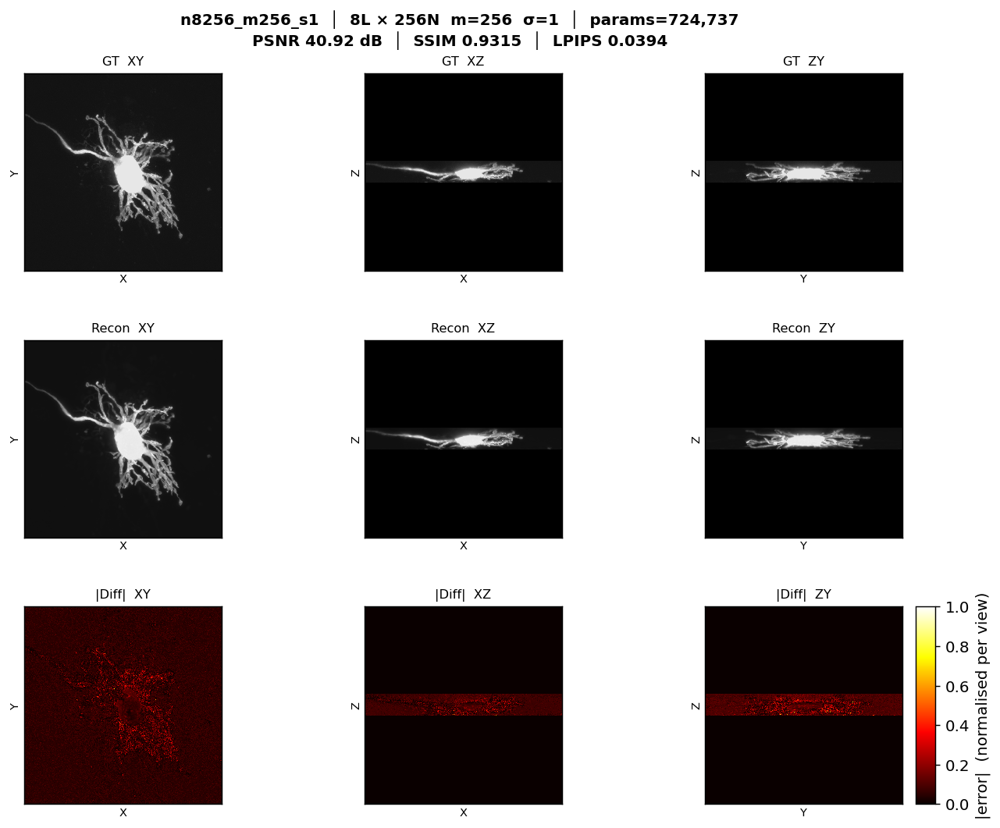

Saved → logs/rff/ablation/mip_n8256_m256_s1.pdf


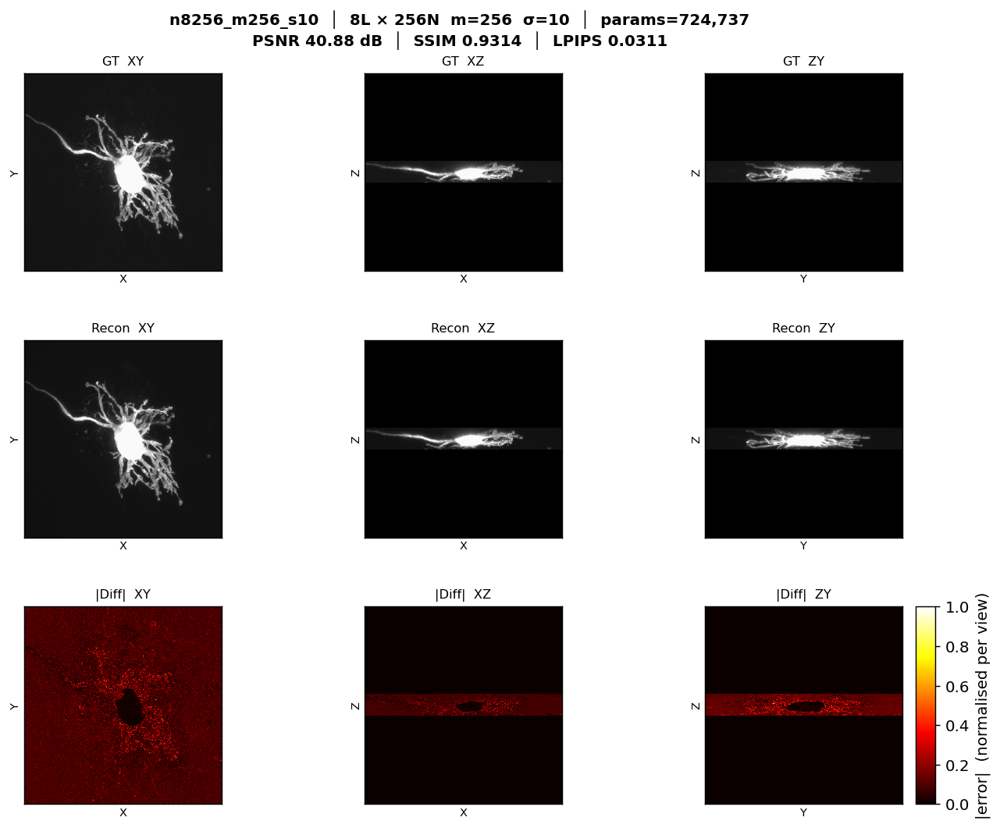

Saved → logs/rff/ablation/mip_n8256_m256_s10.pdf


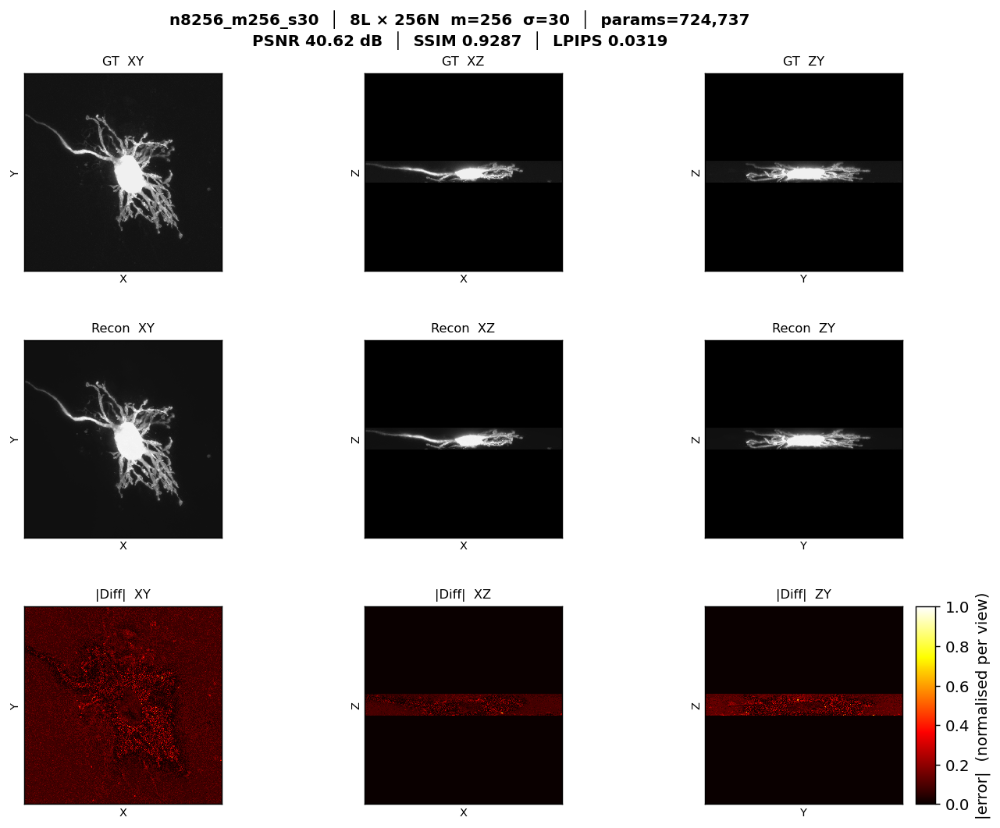

Saved → logs/rff/ablation/mip_n8256_m256_s30.pdf


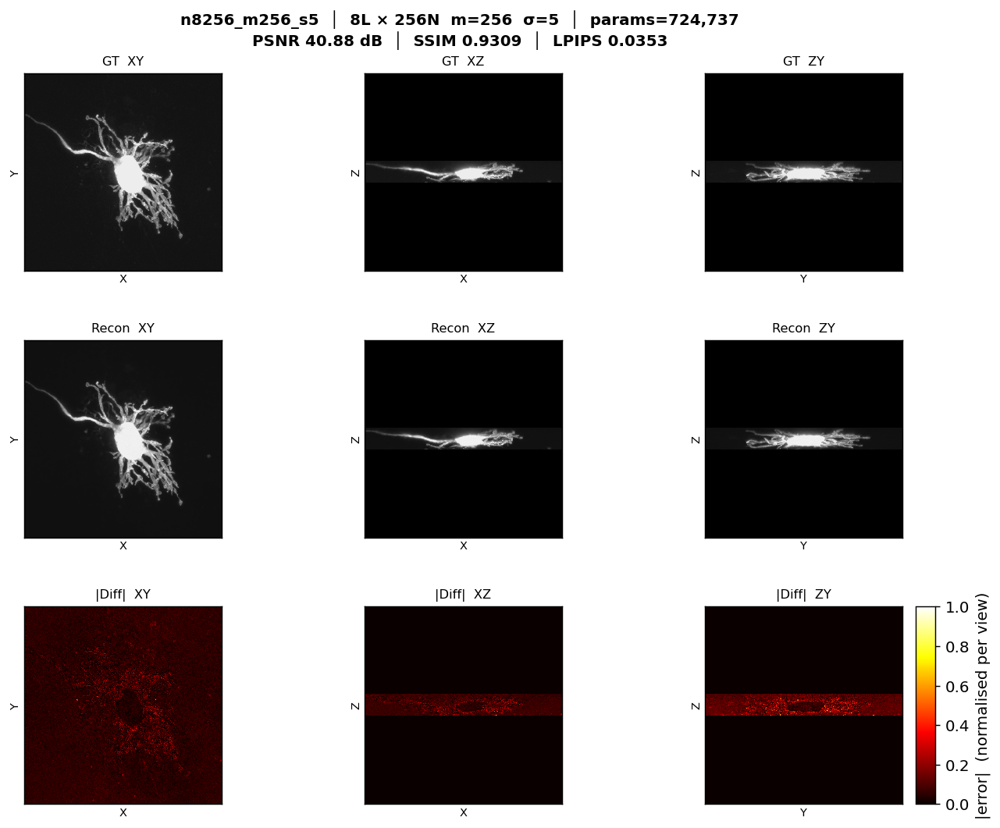

Saved → logs/rff/ablation/mip_n8256_m256_s5.pdf


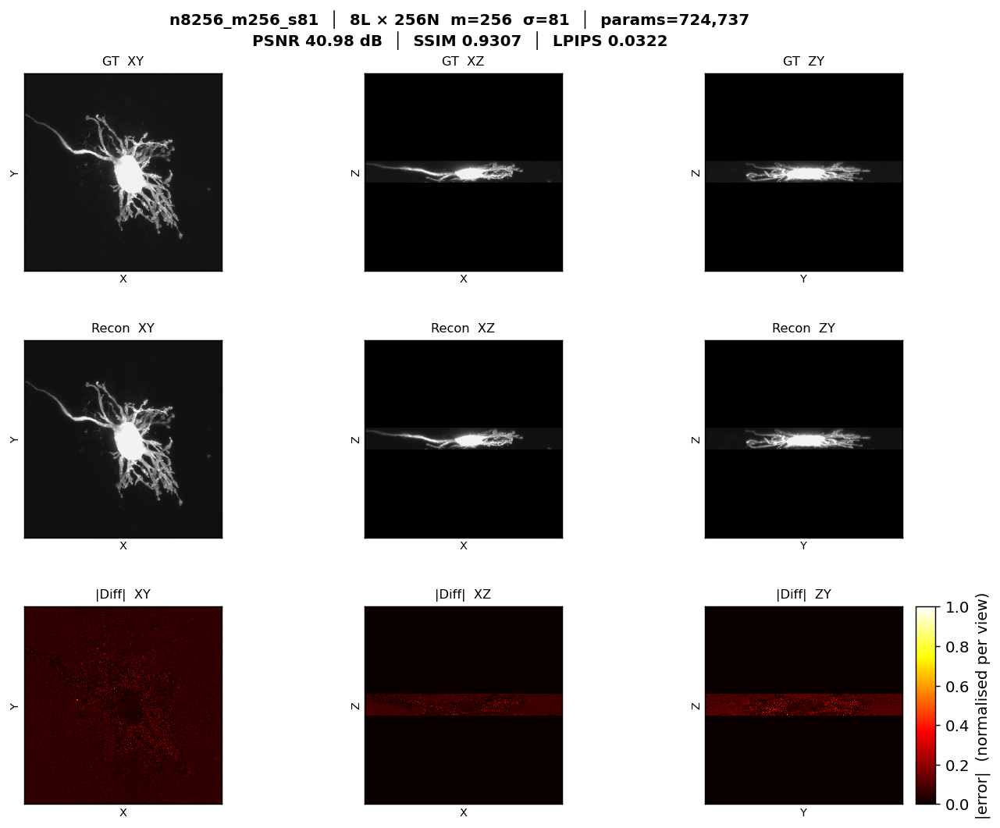

Saved → logs/rff/ablation/mip_n8256_m256_s81.pdf


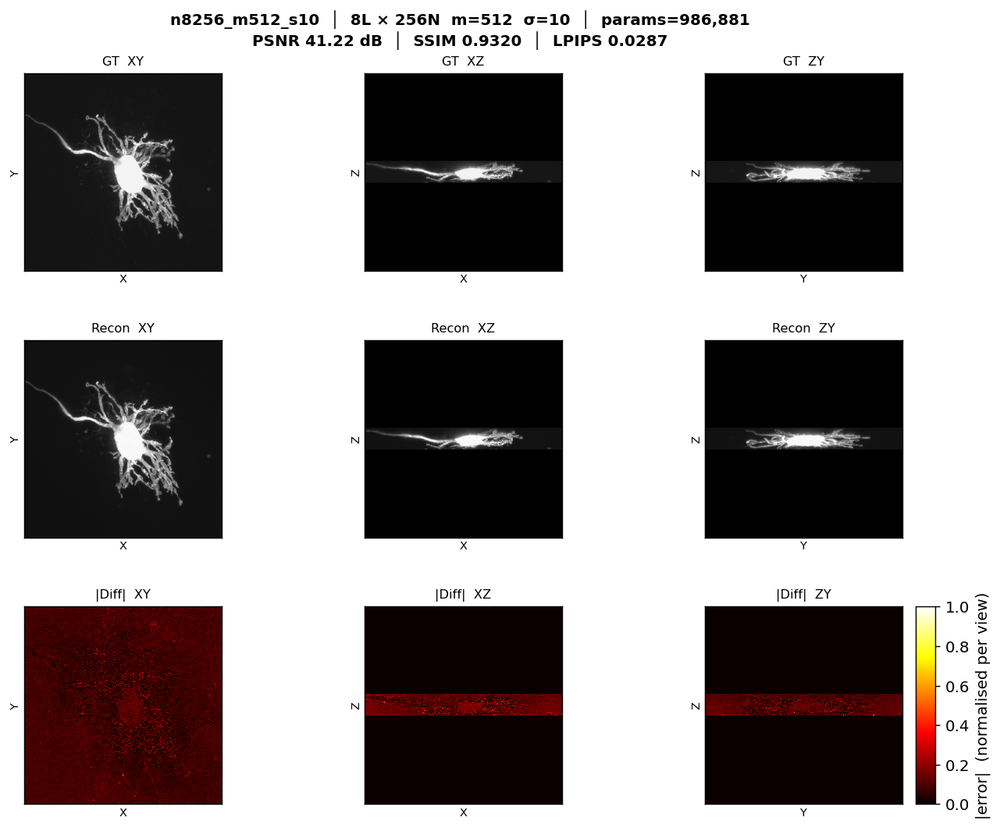

Saved → logs/rff/ablation/mip_n8256_m512_s10.pdf


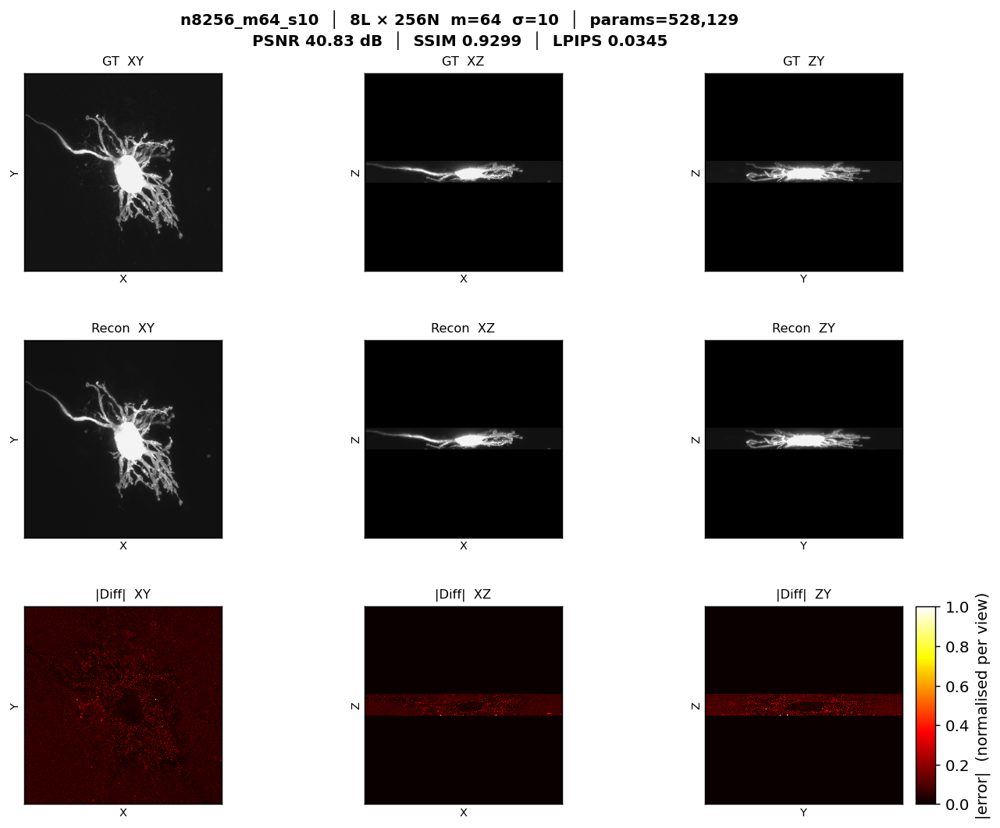

Saved → logs/rff/ablation/mip_n8256_m64_s10.pdf


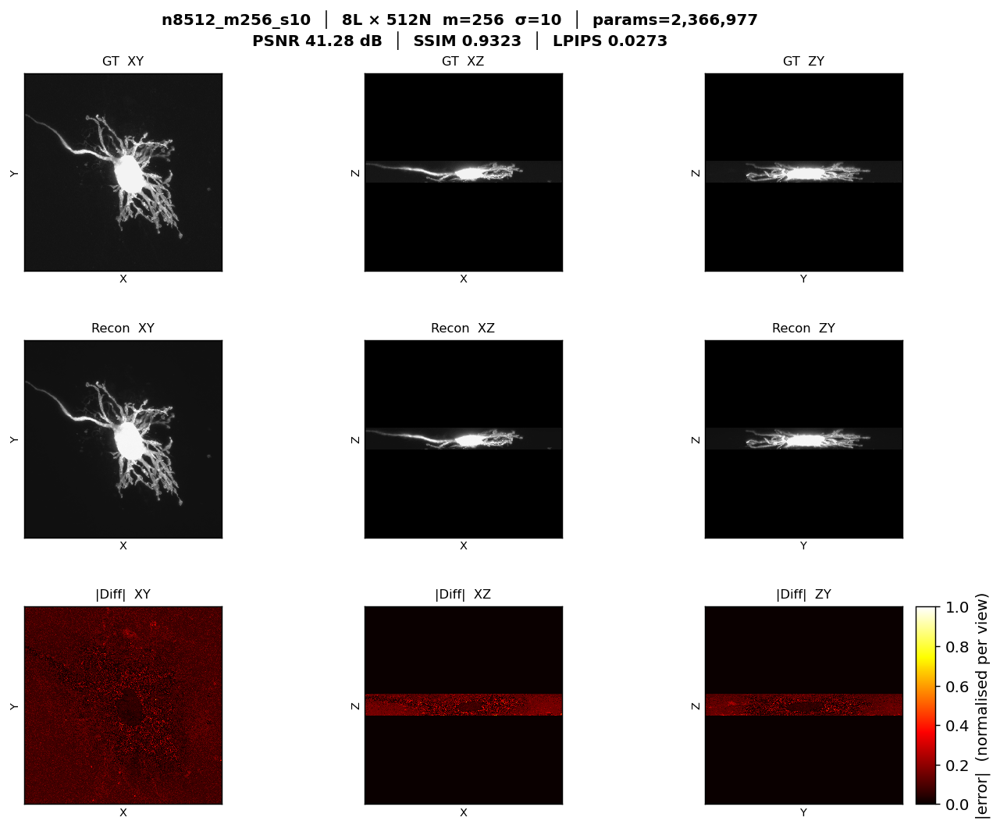

Saved → logs/rff/ablation/mip_n8512_m256_s10.pdf


In [15]:
def pad_square(img, size=1024, fill=0.0):
    """Centre-pad img to size×size without stretching."""
    h, w = img.shape
    out  = np.full((size, size), fill, dtype=np.float32)
    y0   = (size - h) // 2
    x0   = (size - w) // 2
    out[y0:y0+h, x0:x0+w] = img
    return out

for _, row in df.iterrows():
    model = load_rff_model(row)
    if model is None:
        print(f"{row['run']}: no checkpoint, skipping")
        continue

    recon = reconstruct(model)
    psnr_full = float(-10 * np.log10(((recon - gt_vol)**2).mean() + 1e-8))

    views = [
        ('XY', 'X', 'Y', np.max(gt_vol, axis=0), np.max(recon, axis=0)),
        ('XZ', 'X', 'Z', np.max(gt_vol, axis=1), np.max(recon, axis=1)),
        ('ZY', 'Y', 'Z', np.max(gt_vol, axis=2), np.max(recon, axis=2)),
    ]

    fig, axes = plt.subplots(3, 3, figsize=(13, 9))
    fig.subplots_adjust(top=0.91, right=0.88, hspace=0.35, wspace=0.08)
    ssim_s  = f"{float(row['ssim']):.4f}"  if row['ssim']  is not None else 'N/A'
    lpips_s = f"{float(row['lpips']):.4f}" if row['lpips'] is not None else 'N/A'
    fig.suptitle(
        f"{row['run']}  │  {int(row['layers'])}L × {int(row['neurons'])}N  "
        f"m={int(row['rff_features'])}  σ={row['rff_scale']:.0f}  │  params={int(row['n_params']):,}\n"
        f"PSNR {psnr_full:.2f} dB  │  SSIM {ssim_s}  │  LPIPS {lpips_s}",
        fontsize=11, fontweight='bold'
    )

    vmin = min(gt_vol.min(), recon.min())
    vmax = max(gt_vol.max(), recon.max())

    for col, (label, xlabel, ylabel, gt_mip, rc_mip) in enumerate(views):
        diff_mip = np.abs(gt_mip - rc_mip)
        diff_max = diff_mip.max() + 1e-8

        gt_sq   = pad_square(gt_mip)
        rc_sq   = pad_square(rc_mip)
        diff_sq = pad_square(diff_mip / diff_max)

        for row_idx, (img, cmap, vlo, vhi, title) in enumerate([
            (gt_sq,   'gray', vmin, vmax, f'GT  {label}'),
            (rc_sq,   'gray', vmin, vmax, f'Recon  {label}'),
            (diff_sq, 'hot',  0,    1,    f'|Diff|  {label}'),
        ]):
            ax = axes[row_idx, col]
            im_obj = ax.imshow(img, cmap=cmap, vmin=vlo, vmax=vhi,
                               aspect='equal', interpolation='nearest')
            ax.set_title(title, fontsize=9)
            ax.set_xlabel(xlabel, fontsize=8, labelpad=2)
            ax.set_ylabel(ylabel, fontsize=8, labelpad=2)
            ax.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
            if row_idx == 2:
                im = im_obj

    fig.canvas.draw()
    p0 = axes[2, 0].get_position()
    p1 = axes[2, -1].get_position()
    cbar_ax = fig.add_axes([p1.x1 + 0.01, p0.y0, 0.015, p0.y1 - p0.y0])
    fig.colorbar(im, cax=cbar_ax, label='|error|  (normalised per view)')

    out = LOGS / 'ablation' / f"mip_{row['run']}.pdf"
    plt.savefig(out, dpi=600, bbox_inches='tight')
    plt.show()
    print(f'Saved → {out}')
    torch.cuda.empty_cache()
